# DSBA6165 - Group Project
## Group 1 - Medical Image Classifiers

*   Anulitha Vardhan
*   Carsten Lingemann
*   Sundari Kala


# Imports and General Functions

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models, datasets, Model, utils
print("TF version:", tf.__version__)

import matplotlib.pyplot as plt   
import numpy as np
import pandas as pd
import seaborn as sns

import pathlib

%matplotlib inline

TF version: 2.12.0


In [2]:
tf.get_logger().setLevel('ERROR')

In [3]:
def show_image(x, title="", bot=""):
    plt.imshow(x)
    plt.xticks([])
    plt.yticks([])
    plt.title(title)
    plt.xlabel(bot)


In [4]:
def display_images(ds):
    class_names = ds.class_names
    plt.figure(figsize=(10, 10))
    for images, labels in ds.take(1):
      for i in range(20):
        ax = plt.subplot(4, 5, i + 1)
        show_image(images[i].numpy().astype("uint8"), class_names[labels[i]])
    plt.tight_layout()


In [5]:
def display_images_with_predictions(ds, pred_model):
    class_names = ds.class_names
    plt.figure(figsize=(10, 10))
    for images, labels in ds.take(1):
      predictions = pred_model.predict(images)
      predicted_classes = np.argmax(predictions, axis=1)
      for i in range(20):
        ax = plt.subplot(4, 5, i + 1)
        show_image(images[i].numpy().astype("uint8"), class_names[labels[i]], f'Predicted: {class_names[predicted_classes[i]]}')
    plt.tight_layout()


In [6]:
data_augmentation = keras.Sequential([
    layers.RandomZoom(0.2),
    layers.RandomFlip("horizontal"),
    layers.RandomWidth(0.1),
    layers.RandomHeight(0.1),
    layers.RandomFlip("vertical"),
    layers.RandomCrop(180,180)
])

In [7]:
def display_augmented_images(ds):
    plt.figure(figsize=(10, 10))
    for images, _ in ds.take(1):
        
        plt.figure(figsize=(10,8))
        plt.subplot(3, 4, 5)
        plt.imshow(images[0].numpy().astype("uint8"))
        plt.axis("off")

        print(f"Shape of Batch: {images.shape}")   
        
        for i in range(9):
            augmented_images = data_augmentation(images)
            ax = plt.subplot(3, 4, int(i/3)*4 + 2 + (i % 3))
            plt.imshow(augmented_images[0].numpy().astype("uint8"))
            plt.axis("off")
        plt.tight_layout()


In [8]:
def plot_learning(history):
    tgts = ['loss','accuracy']
    i=0

    plt.figure(figsize=(10, 5))
    for tgt in tgts:
      ax = plt.subplot(1,2, i + 1)
      plt.plot(history.history[tgt], label=tgt)
      plt.plot(history.history['val_'+tgt], label='val_'+tgt)
      plt.xlabel('Epoch')
      plt.legend()
      plt.title(f"Training and validation {tgt}")
      i +=1


In [9]:
# global variables used for all datasets and models
IMG_SIZE = 224
BATCH_SIZE = 32
NUM_EPOCHS = 10


In [11]:
def train_model(train_ds, valid_ds, model, cb_name, optimizer, loss):
    model.compile(optimizer=optimizer, loss=loss, metrics=['accuracy'])
    cb = keras.callbacks.ModelCheckpoint(cb_name, monitor='val_loss', save_best_only=True)
    history = model.fit(train_ds, epochs=NUM_EPOCHS, validation_data=valid_ds, callbacks=cb)
    plot_learning(history)


In [10]:
def evaluate_model(cb_name, test_ds):
    test_model = keras.models.load_model(cb_name)
    test_model.evaluate(test_ds)
    display_images_with_predictions(test_ds, test_model)


# Data


## Kaggle Setup

Please follow the steps below to be able to download the dataset from Kaggle:

1. Create a Kaggle account, if you do not already have one. 
2. Go to Account page, click on "Create New API Token" under API. This will create and download `kaggle.json`. 
2. Upload the `kaggle.json` file by running the cell below.

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"sundarikala","key":"c0356c20833e2487fd82f47fcf4da722"}'}

In [ ]:
# Setting up kaggle API
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

## Brain Tumor MRI Dataset

The [Brain Tumor MRI Dataset](https://www.kaggle.com/datasets/masoudnickparvar/brain-tumor-mri-dataset) contains brain tumor images under 4 categories:

*   Glioma Tumor
*   Meningioma Tumor
*   Pituitary Tumor
*   No Tumor

The Train and Test data is separated in different directories within the zip file:

*   Training: /training (contains ~5.7k images)
*   Testing: /testing (contains ~1.3k images)

As there is no validation folder, we will use an 80/20 split on the training folder for training and validation.

In [ ]:
!kaggle datasets download -d masoudnickparvar/brain-tumor-mri-dataset

 94% 140M/149M [00:00<00:00, 201MB/s]
100% 149M/149M [00:00<00:00, 195MB/s]


In [ ]:
!unzip /content/brain-tumor-mri-dataset.zip -d /content/brain-tumor-mri-dataset

Streaming output truncated to the last 5000 lines.
  inflating: /content/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0712.jpg  
  inflating: /content/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0713.jpg  
  inflating: /content/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0714.jpg  
  inflating: /content/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0715.jpg  
  inflating: /content/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0716.jpg  
  inflating: /content/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0717.jpg  
  inflating: /content/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0718.jpg  
  inflating: /content/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0719.jpg  
  inflating: /content/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0720.jpg  
  inflating: /content/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0721.jpg  
  inflating: /content/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0722.jpg  
  inflating: /content/brain-tumor-mri-dataset/Training/glioma/Tr-gl_0723.jpg  
 

In [ ]:
!ls -l /content/brain-tumor-mri-dataset/Training

total 220
drwxr-xr-x 2 root root 45056 May  5 08:33 glioma
drwxr-xr-x 2 root root 53248 May  5 08:33 meningioma
drwxr-xr-x 2 root root 69632 May  5 08:33 notumor
drwxr-xr-x 2 root root 57344 May  5 08:33 pituitary


In [ ]:
!ls -l /content/brain-tumor-mri-dataset/Training/*/*.jpg | wc -l

5712


In [ ]:
!ls -l /content/brain-tumor-mri-dataset/Testing/*/*.jpg | wc -l

1311


In [ ]:
train_path = pathlib.Path('/content/brain-tumor-mri-dataset/Training')
test_path = pathlib.Path('/content/brain-tumor-mri-dataset/Testing')

bt_train_ds, bt_valid_ds = utils.image_dataset_from_directory(
    train_path,
    validation_split=0.2,
    subset="both",
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )

bt_test_ds = utils.image_dataset_from_directory(
    test_path, 
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )


Found 5712 files belonging to 4 classes.
Using 4570 files for training.
Using 1142 files for validation.
Found 1311 files belonging to 4 classes.


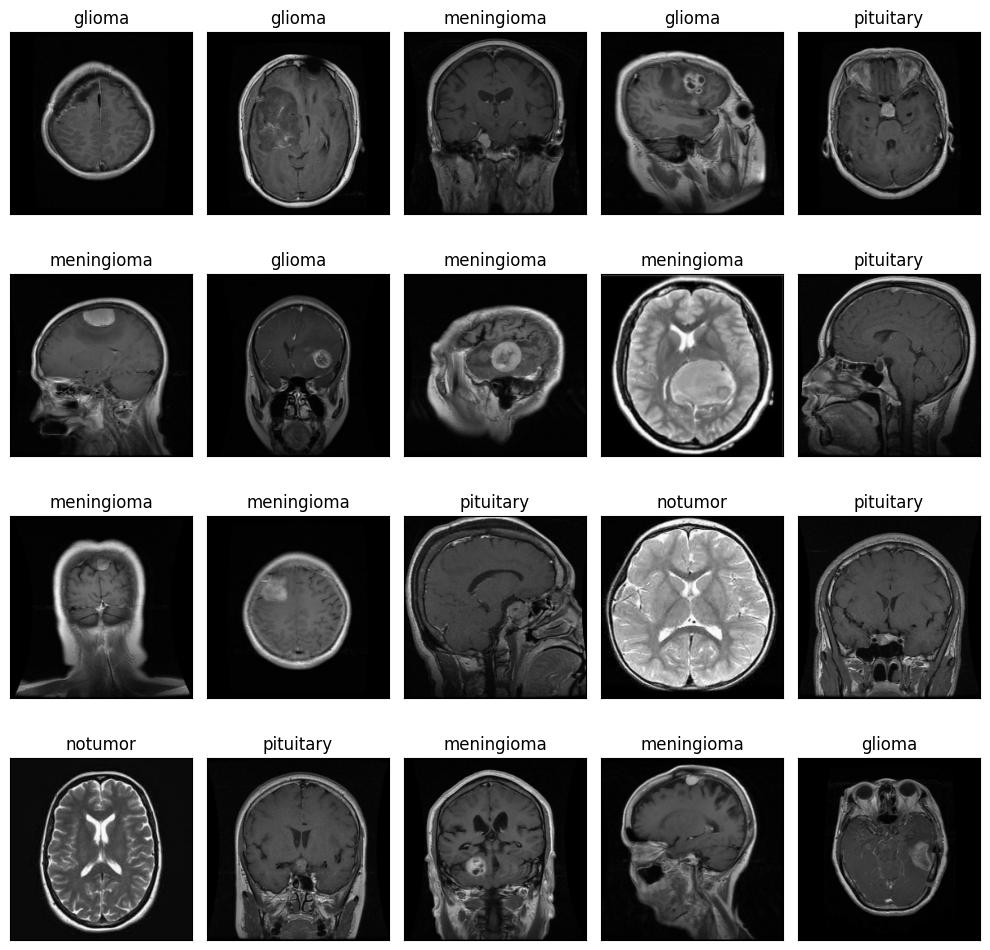

In [ ]:
display_images(bt_train_ds)

Shape of Batch: (32, 224, 224, 3)


<Figure size 1000x1000 with 0 Axes>

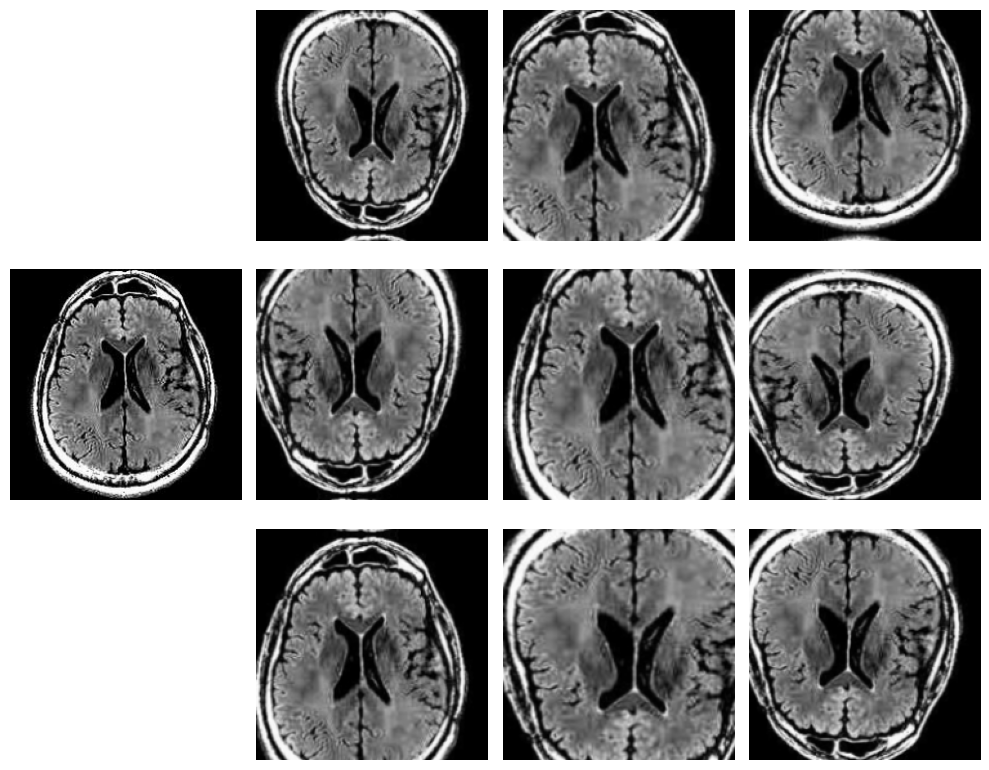

In [ ]:
display_augmented_images(bt_train_ds)

## Leukemia Classification Dataset

The [Leukemia Classification](https://www.kaggle.com/datasets/abeerelmorshedy/leukemia) Dataset contains blood cell images under 2 categories:

*   hem - normal cell
*   all - acute lymphoblastic leukemia

The Train, Validation, and Test data is separated in different directories within the zip file:

*   Training: /training (contains ~6k images)
*   Validation: /validation (contains ~1.3k images)
*   Testing: /testing (contains ~1.3k images)


In [ ]:
!kaggle datasets download -d abeerelmorshedy/leukemia

 98% 457M/466M [00:06<00:00, 91.5MB/s]
100% 466M/466M [00:06<00:00, 76.6MB/s]


In [ ]:
!unzip /content/leukemia.zip -d /content/leukemia

Streaming output truncated to the last 5000 lines.
  inflating: /content/leukemia/training/all/UID_44_16_1_all.bmp  
  inflating: /content/leukemia/training/all/UID_44_16_2_all.bmp  
  inflating: /content/leukemia/training/all/UID_44_16_3_all.bmp  
  inflating: /content/leukemia/training/all/UID_44_16_4_all.bmp  
  inflating: /content/leukemia/training/all/UID_44_17_1_all.bmp  
  inflating: /content/leukemia/training/all/UID_44_1_1_all.bmp  
  inflating: /content/leukemia/training/all/UID_44_1_2_all.bmp  
  inflating: /content/leukemia/training/all/UID_44_1_3_all.bmp  
  inflating: /content/leukemia/training/all/UID_44_1_4_all.bmp  
  inflating: /content/leukemia/training/all/UID_44_1_5_all.bmp  
  inflating: /content/leukemia/training/all/UID_44_1_6_all.bmp  
  inflating: /content/leukemia/training/all/UID_44_1_7_all.bmp  
  inflating: /content/leukemia/training/all/UID_44_2_1_all.bmp  
  inflating: /content/leukemia/training/all/UID_44_2_2_all.bmp  
  inflating: /content/leukemia/tra

In [ ]:
!ls -l /content/leukemia/training

total 240
drwxr-xr-x 2 root root 143360 May  5 05:57 all
drwxr-xr-x 2 root root 102400 May  5 05:57 hem


In [ ]:
!ls -l /content/leukemia/training/*/*.bmp | wc -l

6090


In [ ]:
!ls -l /content/leukemia/validation/*/*.bmp | wc -l

1260


In [ ]:
!ls -l /content/leukemia/testing/*/*.bmp | wc -l

1263


In [ ]:
train_path = pathlib.Path('/content/leukemia/training')
valid_path = pathlib.Path('/content/leukemia/validation')
test_path = pathlib.Path('/content/leukemia/testing')

leu_train_ds = utils.image_dataset_from_directory(
    train_path,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )

leu_valid_ds = utils.image_dataset_from_directory(
    valid_path,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )

leu_test_ds = utils.image_dataset_from_directory(
    test_path, 
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )


Found 6090 files belonging to 2 classes.
Found 1260 files belonging to 2 classes.
Found 1263 files belonging to 2 classes.


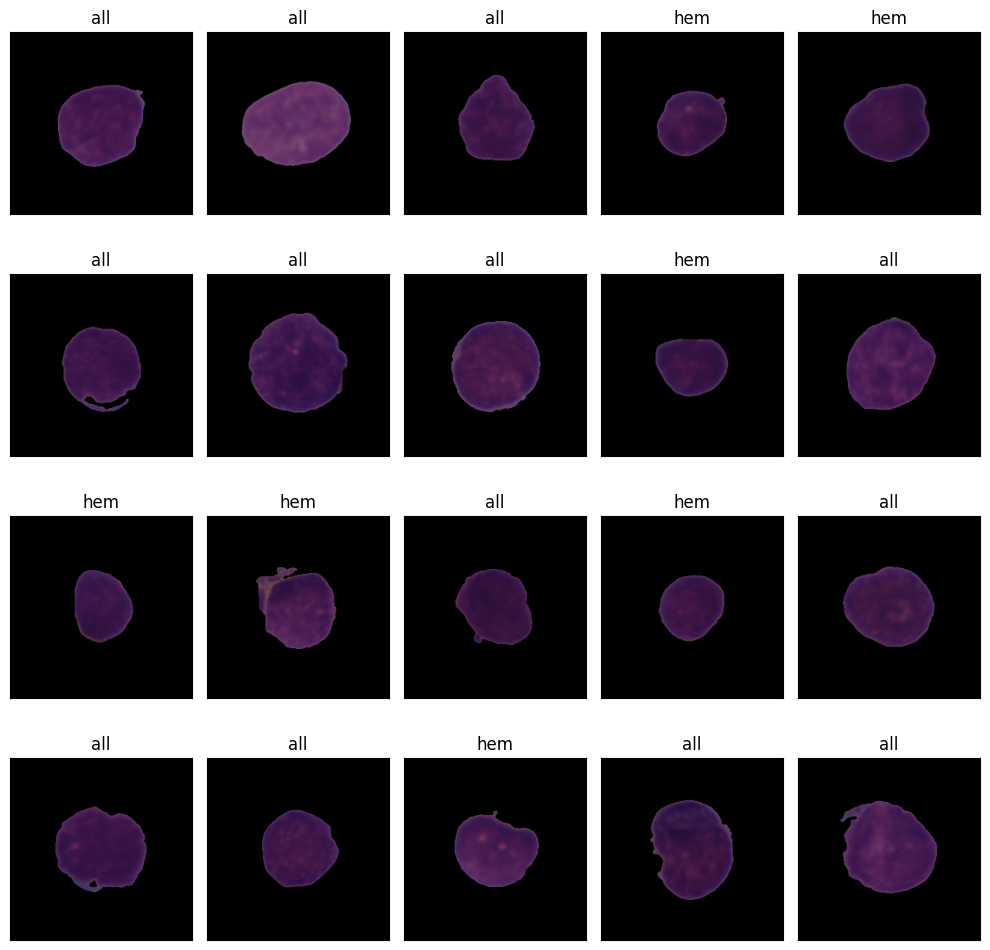

In [ ]:
display_images(leu_train_ds)

Shape of Batch: (32, 224, 224, 3)


<Figure size 1000x1000 with 0 Axes>

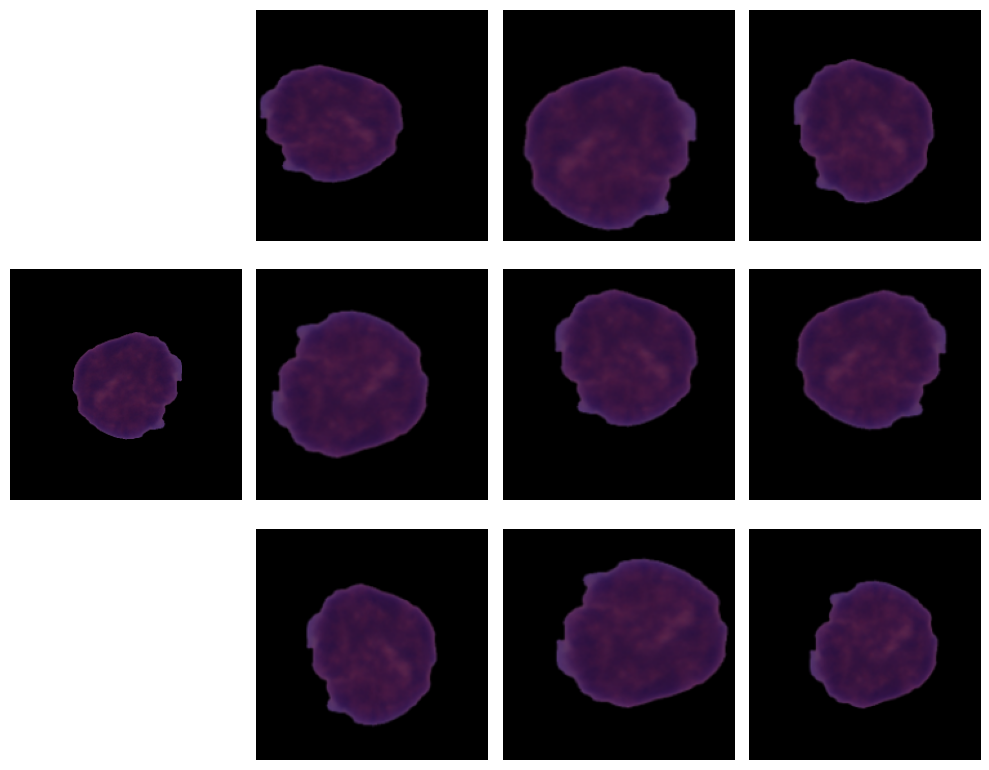

In [ ]:
display_augmented_images(leu_train_ds)

In [ ]:
!kaggle datasets download -d artyomkolas/3-kinds-of-pneumonia

100% 3.48G/3.49G [00:25<00:00, 134MB/s]
100% 3.49G/3.49G [00:25<00:00, 148MB/s]


In [ ]:
!unzip -q /content/3-kinds-of-pneumonia.zip -d /content

In [ ]:
!mv '/content/Curated X-Ray Dataset' /content/Curated_X-Ray_Dataset

In [ ]:
!ls -l /content/Curated_X-Ray_Dataset

total 468
drwxr-xr-x 2 root root  57344 May  5 06:11 COVID-19
drwxr-xr-x 2 root root 135168 May  5 06:11 Normal
drwxr-xr-x 2 root root 180224 May  5 06:11 Pneumonia-Bacterial
drwxr-xr-x 2 root root  98304 May  5 06:11 Pneumonia-Viral


In [ ]:
!pip install split-folders
import splitfolders
splitfolders.ratio('/content/Curated_X-Ray_Dataset', output='/content/Curated_X-Ray_Dataset/split', seed=42, ratio=(0.5, 0.2, 0.3))

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Copying files: 9208 files [00:34, 266.81 files/s]


In [ ]:
!ls -l /content/Curated_X-Ray_Dataset/split/train/*/*.jpg | wc -l

4603


In [ ]:
!ls -l /content/Curated_X-Ray_Dataset/split/val/*/*.jpg | wc -l

1841


In [ ]:
!ls -l /content/Curated_X-Ray_Dataset/split/*

/content/Curated_X-Ray_Dataset/split/test:
total 156
drwxr-xr-x 2 root root 20480 May  5 06:12 COVID-19
drwxr-xr-x 2 root root 36864 May  5 06:12 Normal
drwxr-xr-x 2 root root 61440 May  5 06:12 Pneumonia-Bacterial
drwxr-xr-x 2 root root 36864 May  5 06:12 Pneumonia-Viral

/content/Curated_X-Ray_Dataset/split/train:
total 240
drwxr-xr-x 2 root root 36864 May  5 06:12 COVID-19
drwxr-xr-x 2 root root 69632 May  5 06:12 Normal
drwxr-xr-x 2 root root 94208 May  5 06:12 Pneumonia-Bacterial
drwxr-xr-x 2 root root 45056 May  5 06:12 Pneumonia-Viral

/content/Curated_X-Ray_Dataset/split/val:
total 112
drwxr-xr-x 2 root root 12288 May  5 06:12 COVID-19
drwxr-xr-x 2 root root 36864 May  5 06:12 Normal
drwxr-xr-x 2 root root 36864 May  5 06:12 Pneumonia-Bacterial
drwxr-xr-x 2 root root 20480 May  5 06:12 Pneumonia-Viral


In [ ]:
train_path = pathlib.Path('/content/Curated_X-Ray_Dataset/split/train')
val_path = pathlib.Path('/content/Curated_X-Ray_Dataset/split/val')
test_path = pathlib.Path('/content/Curated_X-Ray_Dataset/split/test')

xray_train_ds = utils.image_dataset_from_directory(
    train_path,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )

xray_valid_ds = utils.image_dataset_from_directory(
    val_path,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )

xray_test_ds = utils.image_dataset_from_directory(
    test_path, 
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=1
    )

Found 4603 files belonging to 4 classes.
Found 1841 files belonging to 4 classes.
Found 2764 files belonging to 4 classes.


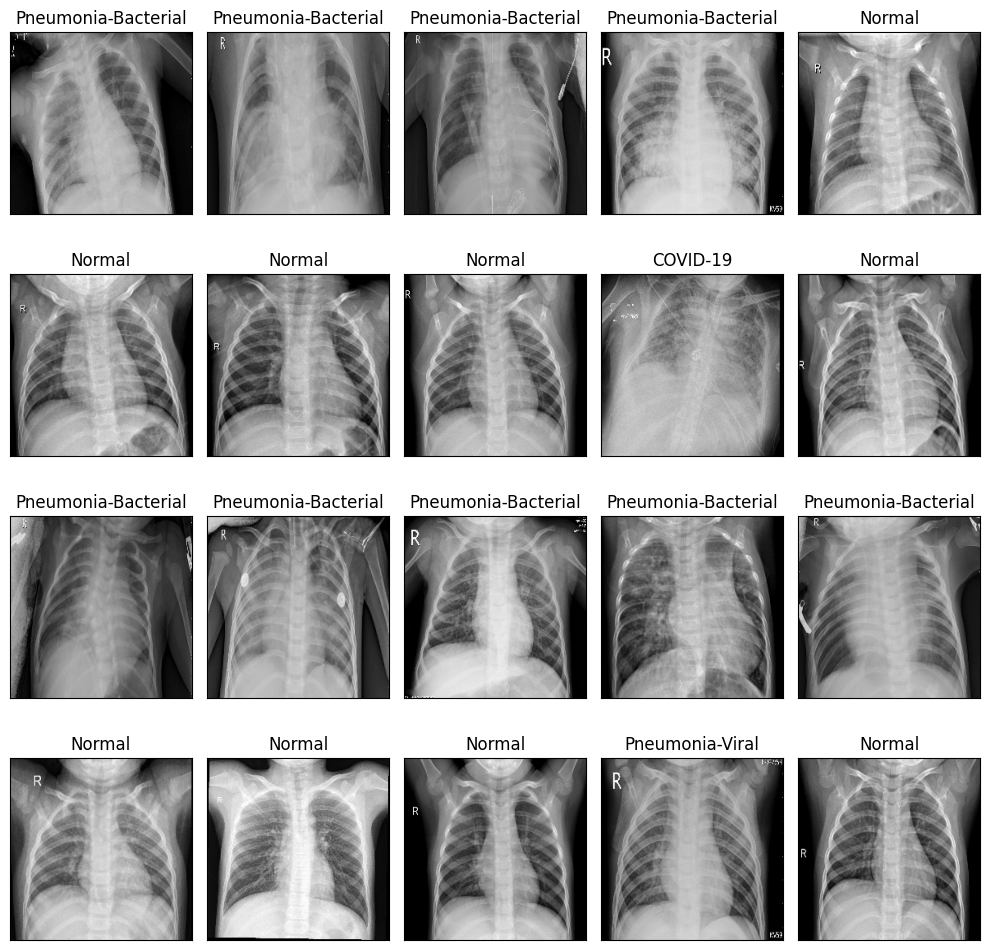

In [ ]:
display_images(xray_train_ds)

Shape of Batch: (32, 224, 224, 3)


<Figure size 1000x1000 with 0 Axes>

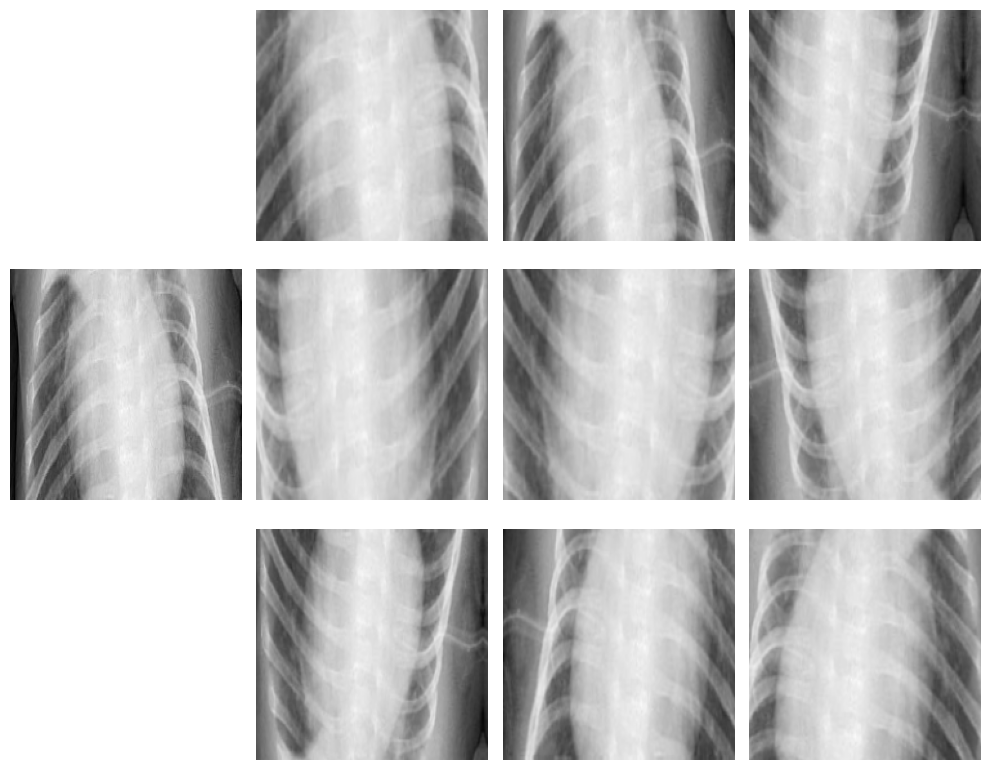

In [ ]:
display_augmented_images(xray_train_ds)

# InceptionV3

In [13]:
inceptionV3_base = keras.applications.inception_v3.InceptionV3(
        weights="imagenet",
        include_top=False,
        input_shape=(IMG_SIZE,IMG_SIZE,3)
    )

inceptionV3_base.trainable= False

inceptionV3_base.summary()

87910968/87910968 [==============================] - 0s 0us/step
Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)           

### Experiment 1

In [ ]:
inputs = keras.Input(shape=(IMG_SIZE,IMG_SIZE,3))
x = data_augmentation(inputs)
x = layers.Resizing(IMG_SIZE,IMG_SIZE)(x)
x = tf.keras.applications.inception_v3.preprocess_input(x)
 
x = inceptionV3_base(x)
x = layers.Flatten()(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(4, activation='softmax')(x)

model = keras.Model(inputs, outputs)

model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 180, 180, 3)       0         
                                                                 
 resizing (Resizing)         (None, 224, 224, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 224, 224, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 inception_v3 (Functional)   (None, 5, 5, 2048)        218027

Epoch 1/10
143/143 [==============================] - 36s 141ms/step - loss: 12.8292 - accuracy: 0.6505 - val_loss: 5.7985 - val_accuracy: 0.7119
Epoch 2/10
143/143 [==============================] - 16s 109ms/step - loss: 6.7966 - accuracy: 0.7416 - val_loss: 2.5754 - val_accuracy: 0.8406
Epoch 3/10
143/143 [==============================] - 15s 105ms/step - loss: 5.0143 - accuracy: 0.7810 - val_loss: 12.5150 - val_accuracy: 0.5385
Epoch 4/10
143/143 [==============================] - 15s 102ms/step - loss: 5.4789 - accuracy: 0.7777 - val_loss: 8.2331 - val_accuracy: 0.7461
Epoch 5/10
143/143 [==============================] - 16s 107ms/step - loss: 4.3700 - accuracy: 0.8085 - val_loss: 2.1665 - val_accuracy: 0.8625
Epoch 6/10
143/143 [==============================] - 15s 105ms/step - loss: 3.7160 - accuracy: 0.8210 - val_loss: 11.8686 - val_accuracy: 0.5876
Epoch 7/10
143/143 [==============================] - 15s 104ms/step - loss: 3.9809 - accuracy: 0.8188 - val_loss: 3.9305 - val

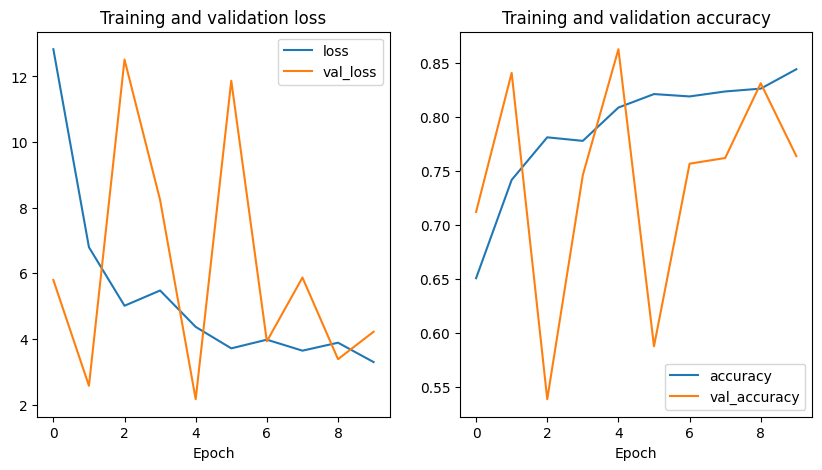

In [ ]:
bt_cb_name = "bt_inception.keras"
train_model(bt_train_ds, bt_valid_ds, model, bt_cb_name, tf.keras.optimizers.experimental.SGD(
    learning_rate=0.01), 'sparse_categorical_crossentropy')

1/1 [==============================] - 2s 2s/step


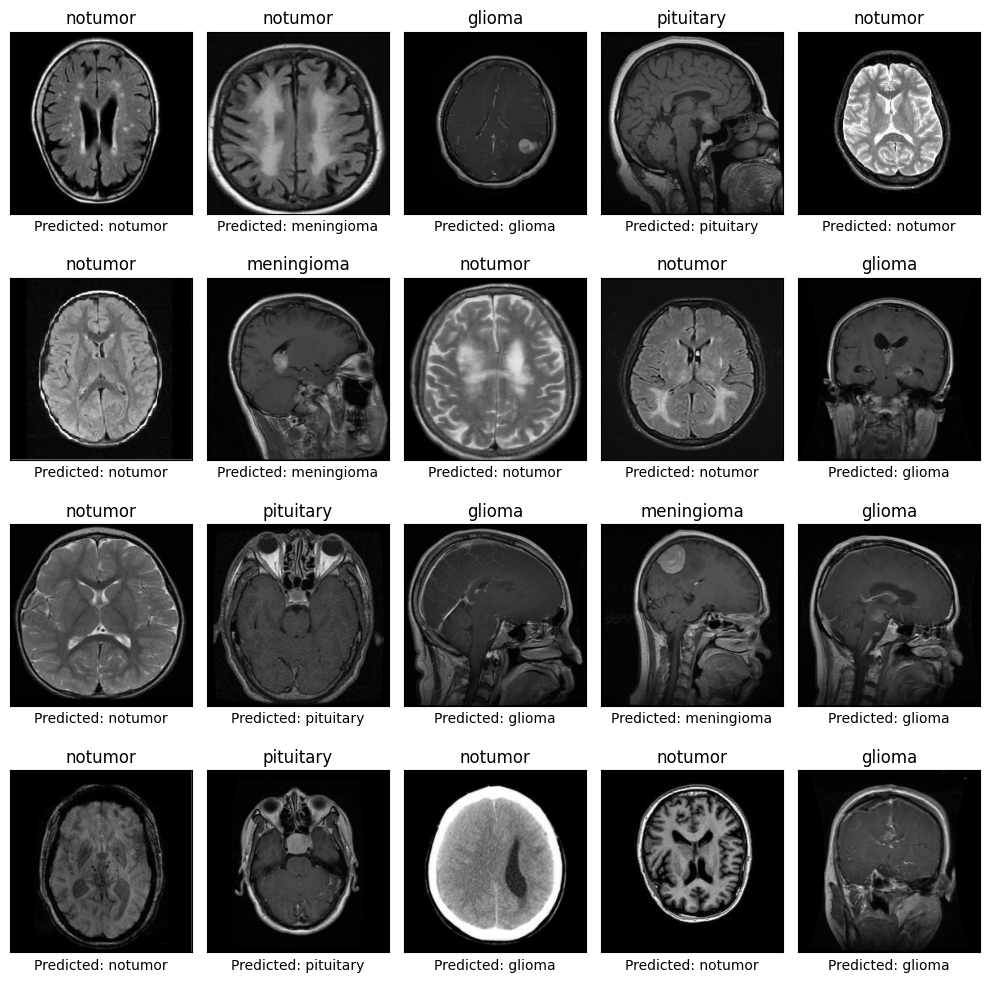

In [ ]:
evaluate_model(bt_cb_name, bt_test_ds)

### Experiment 2

Epoch 1/10
143/143 [==============================] - 22s 118ms/step - loss: 3.0934 - accuracy: 0.8344 - val_loss: 3.1893 - val_accuracy: 0.7277
Epoch 2/10
143/143 [==============================] - 15s 106ms/step - loss: 3.0939 - accuracy: 0.8295 - val_loss: 3.1895 - val_accuracy: 0.7609
Epoch 3/10
143/143 [==============================] - 16s 108ms/step - loss: 3.0935 - accuracy: 0.8263 - val_loss: 3.1891 - val_accuracy: 0.7434
Epoch 4/10
143/143 [==============================] - 16s 108ms/step - loss: 3.0934 - accuracy: 0.8217 - val_loss: 3.1884 - val_accuracy: 0.6716
Epoch 5/10
143/143 [==============================] - 16s 107ms/step - loss: 3.0925 - accuracy: 0.7615 - val_loss: 3.1881 - val_accuracy: 0.6375
Epoch 6/10
143/143 [==============================] - 15s 104ms/step - loss: 3.0920 - accuracy: 0.7247 - val_loss: 3.1889 - val_accuracy: 0.5088
Epoch 7/10
143/143 [==============================] - 18s 122ms/step - loss: 3.0916 - accuracy: 0.6578 - val_loss: 3.1911 - val_ac

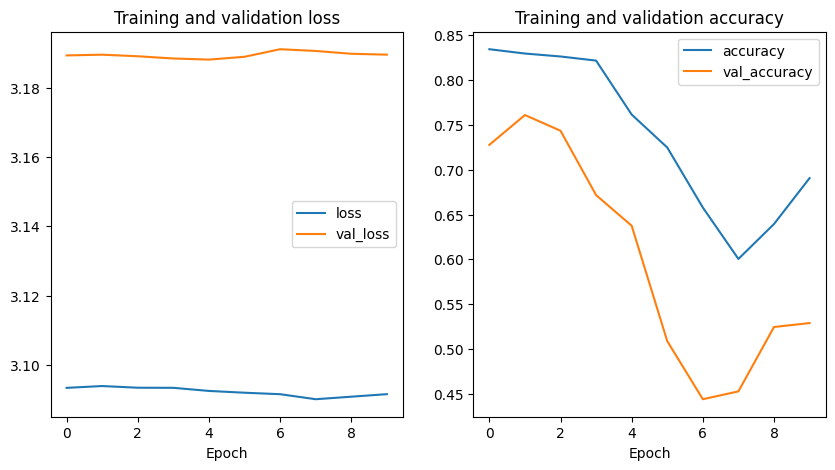

In [ ]:
bt_cb_name = "bt_inception_1.keras"
train_model(bt_train_ds, bt_valid_ds, model, bt_cb_name, tf.keras.optimizers.experimental.SGD(
    learning_rate=0.01), 'mse')

1/1 [==============================] - 1s 1s/step


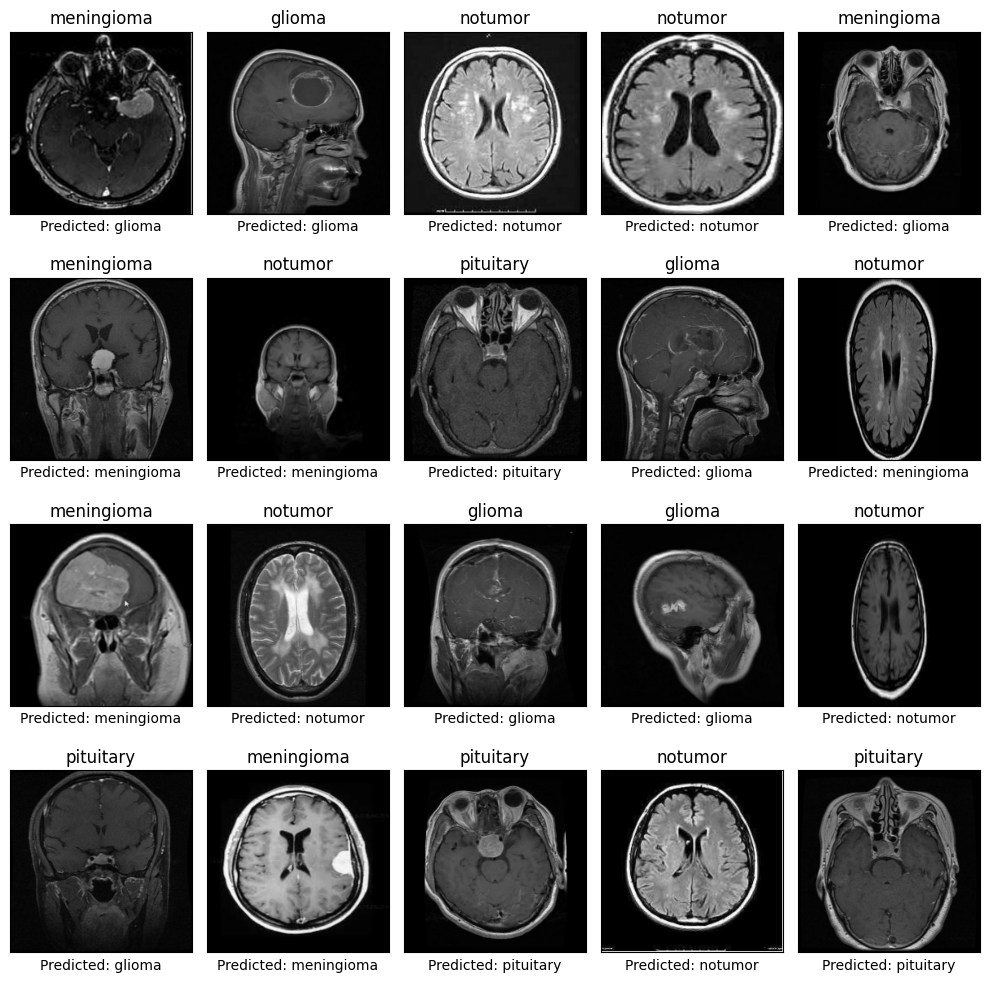

In [ ]:
evaluate_model(bt_cb_name, bt_test_ds)

#### Experiment 2 with learning rate of 0.001

Epoch 1/10
143/143 [==============================] - 25s 136ms/step - loss: 3.0913 - accuracy: 0.6937 - val_loss: 3.1897 - val_accuracy: 0.5236
Epoch 2/10
143/143 [==============================] - 15s 104ms/step - loss: 3.0910 - accuracy: 0.6954 - val_loss: 3.1901 - val_accuracy: 0.5166
Epoch 3/10
143/143 [==============================] - 15s 102ms/step - loss: 3.0914 - accuracy: 0.6864 - val_loss: 3.1900 - val_accuracy: 0.5140
Epoch 4/10
143/143 [==============================] - 15s 102ms/step - loss: 3.0911 - accuracy: 0.6729 - val_loss: 3.1899 - val_accuracy: 0.5123
Epoch 5/10
143/143 [==============================] - 15s 103ms/step - loss: 3.0914 - accuracy: 0.6796 - val_loss: 3.1900 - val_accuracy: 0.5070
Epoch 6/10
143/143 [==============================] - 15s 103ms/step - loss: 3.0905 - accuracy: 0.6687 - val_loss: 3.1900 - val_accuracy: 0.5131
Epoch 7/10
143/143 [==============================] - 15s 104ms/step - loss: 3.0907 - accuracy: 0.6724 - val_loss: 3.1899 - val_ac

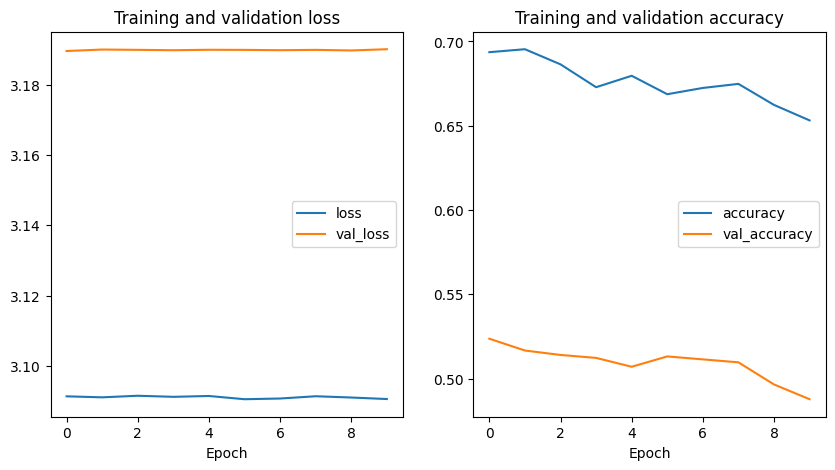

In [ ]:
bt_cb_name = "bt_inception_2.keras"
train_model(bt_train_ds, bt_valid_ds, model, bt_cb_name, tf.keras.optimizers.experimental.SGD(
    learning_rate=0.001), 'mse')

1/1 [==============================] - 2s 2s/step


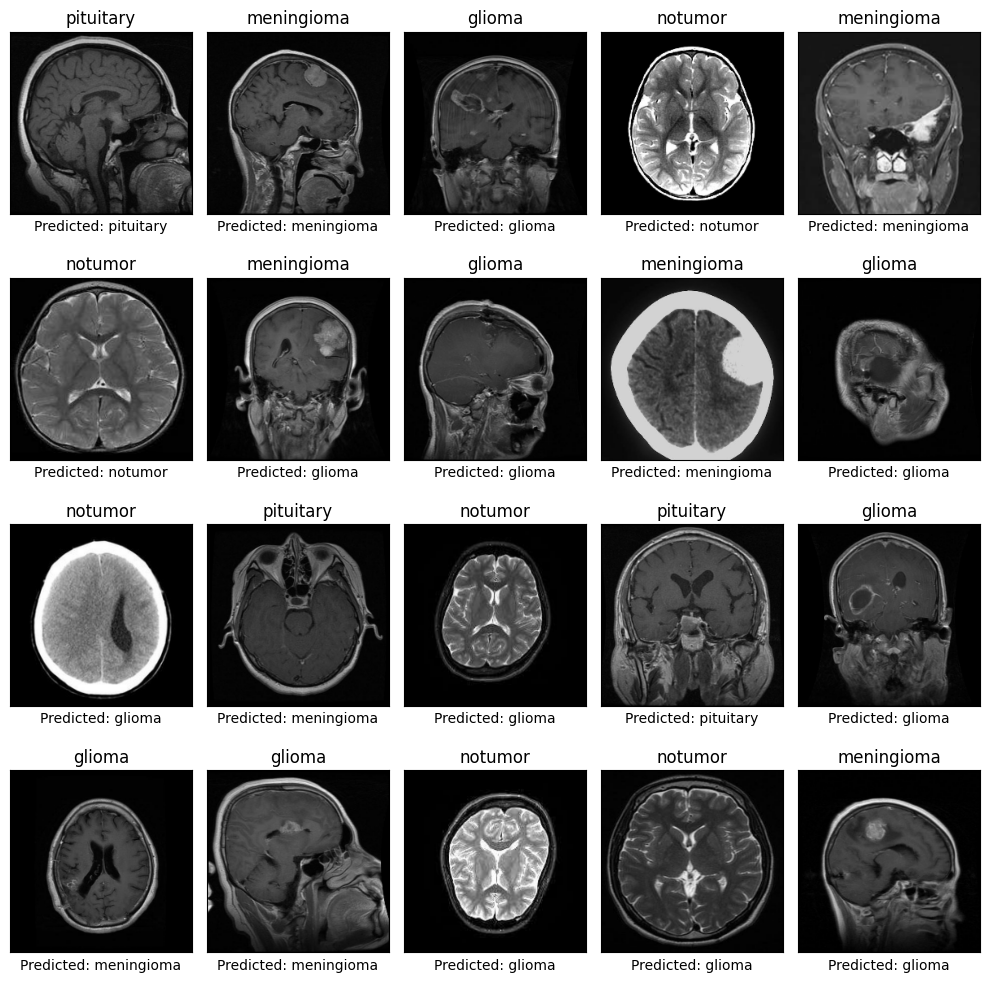

In [ ]:
evaluate_model(bt_cb_name, bt_test_ds)

### Experiment 3

In [ ]:
inputs = keras.Input(shape=(IMG_SIZE,IMG_SIZE,3))
x = data_augmentation(inputs)
x = layers.Resizing(IMG_SIZE,IMG_SIZE)(x)
x = tf.keras.applications.inception_v3.preprocess_input(x)
 
x = inceptionV3_base(x)
x = layers.Flatten()(x)
x = layers.Dense(256,activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(4, activation='softmax')(x)

model_1 = keras.Model(inputs, outputs)

model_1.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 180, 180, 3)       0         
                                                                 
 resizing (Resizing)         (None, 224, 224, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 224, 224, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 inception_v3 (Functional)   (None, 5, 5, 2048)        218027

Epoch 1/10
143/143 [==============================] - 34s 131ms/step - loss: 4.8576 - accuracy: 0.5274 - val_loss: 0.6522 - val_accuracy: 0.7741
Epoch 2/10
143/143 [==============================] - 16s 107ms/step - loss: 0.9226 - accuracy: 0.6245 - val_loss: 0.6116 - val_accuracy: 0.8012
Epoch 3/10
143/143 [==============================] - 15s 102ms/step - loss: 0.8392 - accuracy: 0.6722 - val_loss: 0.7485 - val_accuracy: 0.7399
Epoch 4/10
143/143 [==============================] - 15s 101ms/step - loss: 0.7851 - accuracy: 0.6821 - val_loss: 0.7024 - val_accuracy: 0.7084
Epoch 5/10
143/143 [==============================] - 16s 107ms/step - loss: 0.7616 - accuracy: 0.7037 - val_loss: 0.5294 - val_accuracy: 0.8109
Epoch 6/10
143/143 [==============================] - 15s 103ms/step - loss: 0.7387 - accuracy: 0.7155 - val_loss: 0.5350 - val_accuracy: 0.8240
Epoch 7/10
143/143 [==============================] - 15s 103ms/step - loss: 0.7072 - accuracy: 0.7289 - val_loss: 0.5541 - val_ac

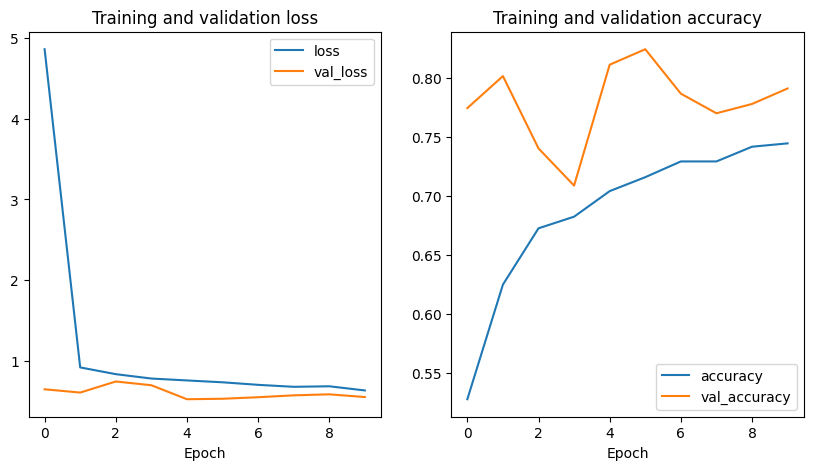

In [ ]:
bt_cb_name = "bt_inception_3.keras"
train_model(bt_train_ds, bt_valid_ds, model_1, bt_cb_name, tf.keras.optimizers.RMSprop(), 'sparse_categorical_crossentropy')

1/1 [==============================] - 2s 2s/step


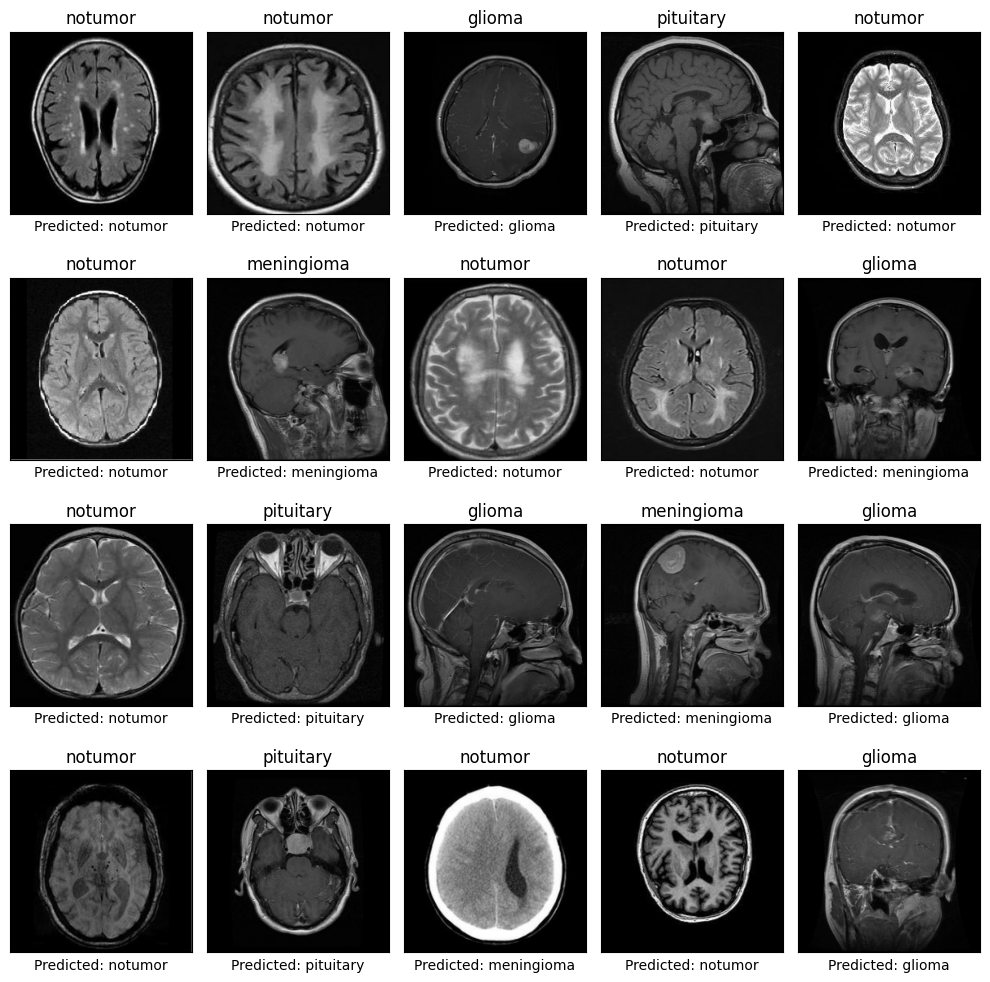

In [ ]:
evaluate_model(bt_cb_name, bt_test_ds)

### Experiment3 with 20 epochs

Epoch 1/20
143/143 [==============================] - 23s 118ms/step - loss: 0.6594 - accuracy: 0.7446 - val_loss: 0.4611 - val_accuracy: 0.8205
Epoch 2/20
143/143 [==============================] - 15s 105ms/step - loss: 0.6466 - accuracy: 0.7635 - val_loss: 0.4973 - val_accuracy: 0.7968
Epoch 3/20
143/143 [==============================] - 16s 108ms/step - loss: 0.6282 - accuracy: 0.7484 - val_loss: 0.4164 - val_accuracy: 0.8625
Epoch 4/20
143/143 [==============================] - 16s 111ms/step - loss: 0.6162 - accuracy: 0.7602 - val_loss: 0.4118 - val_accuracy: 0.8406
Epoch 5/20
143/143 [==============================] - 15s 104ms/step - loss: 0.5889 - accuracy: 0.7737 - val_loss: 0.4236 - val_accuracy: 0.8450
Epoch 6/20
143/143 [==============================] - 15s 104ms/step - loss: 0.6132 - accuracy: 0.7593 - val_loss: 0.4152 - val_accuracy: 0.8494
Epoch 7/20
143/143 [==============================] - 15s 105ms/step - loss: 0.5729 - accuracy: 0.7639 - val_loss: 0.4172 - val_ac

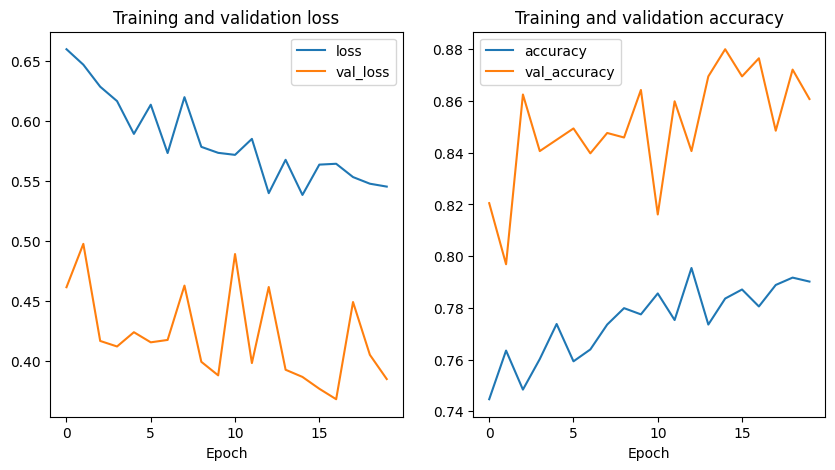

In [ ]:
NUM_EPOCHS = 20
bt_cb_name = "bt_inception_4.keras"
train_model(bt_train_ds, bt_valid_ds, model_1, bt_cb_name, tf.keras.optimizers.RMSprop(), 'sparse_categorical_crossentropy')

1/1 [==============================] - 2s 2s/step


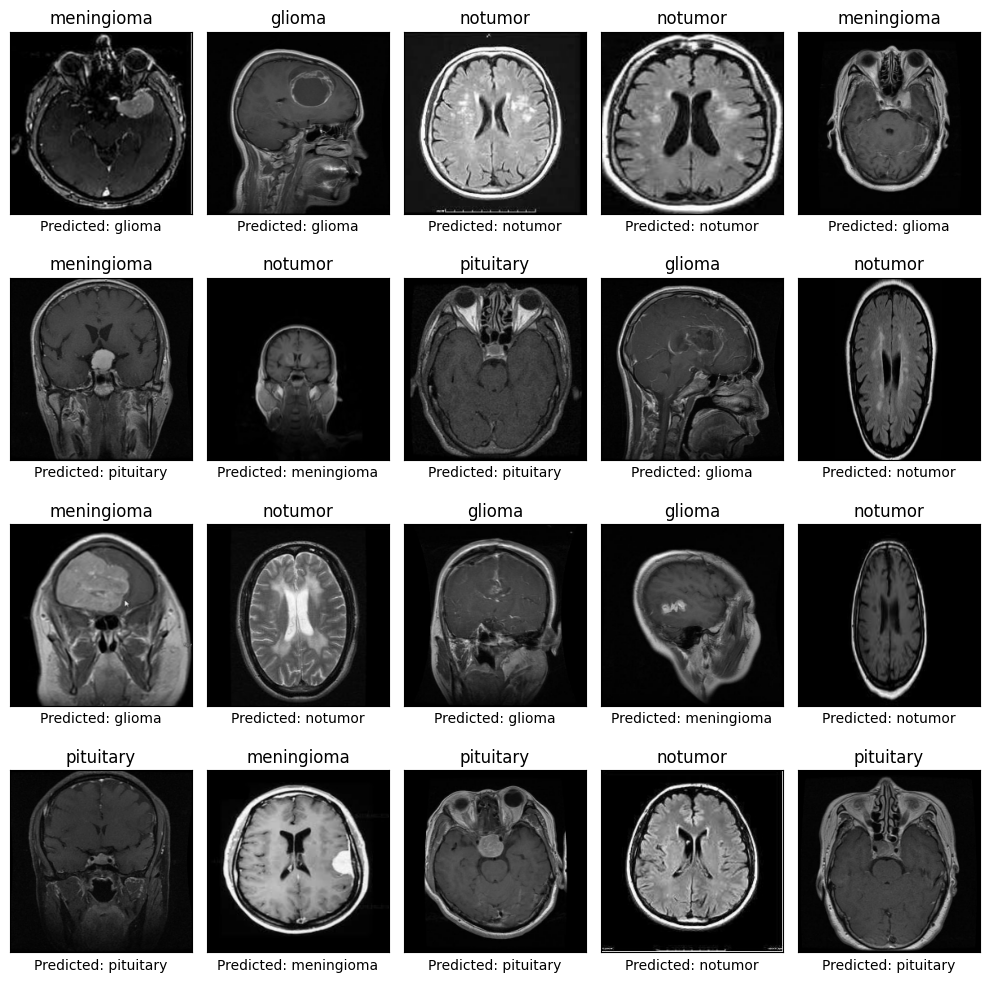

In [ ]:
evaluate_model(bt_cb_name, bt_test_ds)

## Experiment4  

In [ ]:
inputs = keras.Input(shape=(IMG_SIZE,IMG_SIZE,3))
x = data_augmentation(inputs)
x = layers.Resizing(IMG_SIZE,IMG_SIZE)(x)
x = tf.keras.applications.inception_v3.preprocess_input(x)
 
x = inceptionV3_base(x)
x = layers.MaxPooling2D(pool_size=(2, 2))(x) 
x = layers.Flatten()(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(4, activation='softmax')(x)

model_new = keras.Model(inputs, outputs)

model_new.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 180, 180, 3)       0         
                                                                 
 resizing_11 (Resizing)      (None, 224, 224, 3)       0         
                                                                 
 tf.math.truediv_11 (TFOpLam  (None, 224, 224, 3)      0         
 bda)                                                            
                                                                 
 tf.math.subtract_11 (TFOpLa  (None, 224, 224, 3)      0         
 mbda)                                                           
                                                                 
 inception_v3 (Functional)   (None, 5, 5, 2048)        2180

In [ ]:
NUM_EPOCHS=10

Epoch 1/10
143/143 [==============================] - 24s 118ms/step - loss: 3.0110 - accuracy: 0.6670 - val_loss: 0.5210 - val_accuracy: 0.8074
Epoch 2/10
143/143 [==============================] - 15s 104ms/step - loss: 0.5435 - accuracy: 0.7958 - val_loss: 0.5444 - val_accuracy: 0.7811
Epoch 3/10
143/143 [==============================] - 16s 112ms/step - loss: 0.4892 - accuracy: 0.8182 - val_loss: 0.5060 - val_accuracy: 0.8091
Epoch 4/10
143/143 [==============================] - 16s 110ms/step - loss: 0.4637 - accuracy: 0.8230 - val_loss: 0.4457 - val_accuracy: 0.8319
Epoch 5/10
143/143 [==============================] - 16s 107ms/step - loss: 0.4810 - accuracy: 0.8188 - val_loss: 0.4970 - val_accuracy: 0.8004
Epoch 6/10
143/143 [==============================] - 19s 127ms/step - loss: 0.4290 - accuracy: 0.8409 - val_loss: 0.4293 - val_accuracy: 0.8371
Epoch 7/10
143/143 [==============================] - 16s 109ms/step - loss: 0.4101 - accuracy: 0.8438 - val_loss: 0.4122 - val_ac

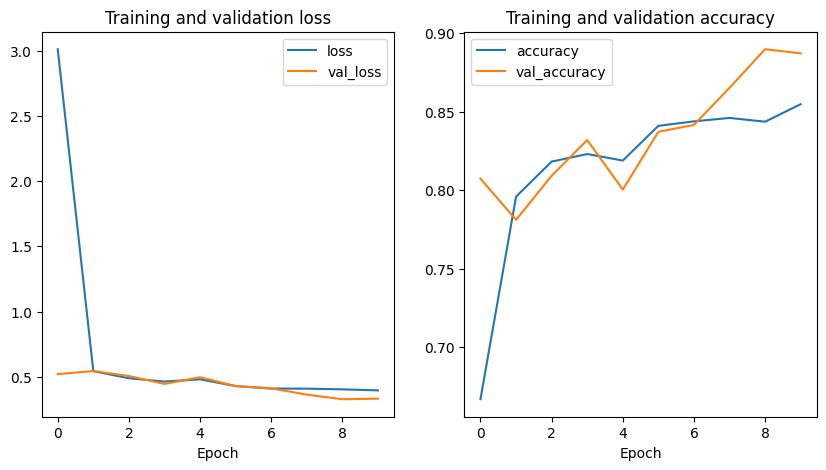

In [ ]:
bt_cb_name = "bt_inception_V3_maxn.keras"
train_model(bt_train_ds, bt_valid_ds, model_new, bt_cb_name, 'Adam', 'sparse_categorical_crossentropy')

1/1 [==============================] - 1s 1s/step


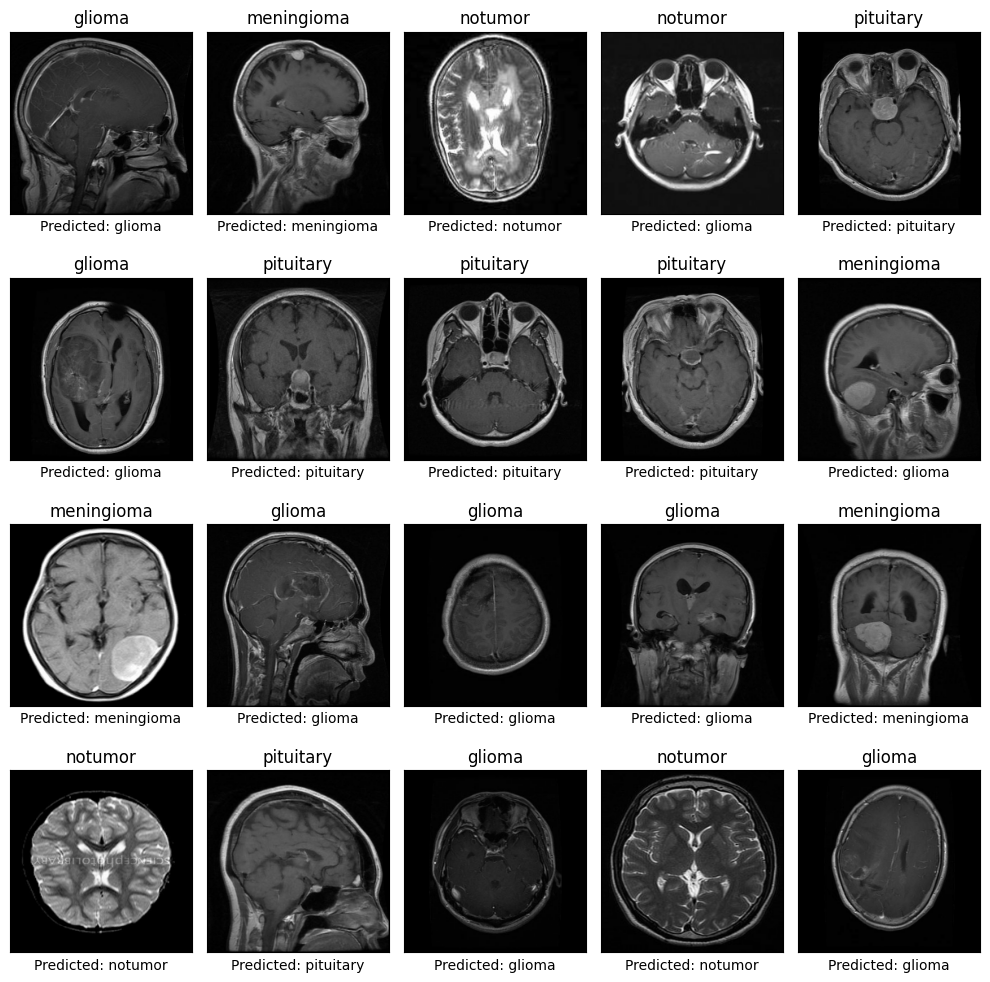

In [ ]:
evaluate_model(bt_cb_name, bt_test_ds)

Epoch 1/10
191/191 [==============================] - 38s 173ms/step - loss: 0.5422 - accuracy: 0.7502 - val_loss: 0.7723 - val_accuracy: 0.5746
Epoch 2/10
191/191 [==============================] - 26s 136ms/step - loss: 0.4915 - accuracy: 0.7782 - val_loss: 0.7897 - val_accuracy: 0.5659
Epoch 3/10
191/191 [==============================] - 26s 134ms/step - loss: 0.4712 - accuracy: 0.7882 - val_loss: 0.7373 - val_accuracy: 0.5889
Epoch 4/10
191/191 [==============================] - 28s 145ms/step - loss: 0.4610 - accuracy: 0.7939 - val_loss: 0.7350 - val_accuracy: 0.6103
Epoch 5/10
191/191 [==============================] - 26s 134ms/step - loss: 0.4585 - accuracy: 0.8034 - val_loss: 0.7379 - val_accuracy: 0.6079
Epoch 6/10
191/191 [==============================] - 26s 132ms/step - loss: 0.4477 - accuracy: 0.8079 - val_loss: 0.7639 - val_accuracy: 0.6151
Epoch 7/10
191/191 [==============================] - 27s 135ms/step - loss: 0.4509 - accuracy: 0.8000 - val_loss: 0.7096 - val_ac

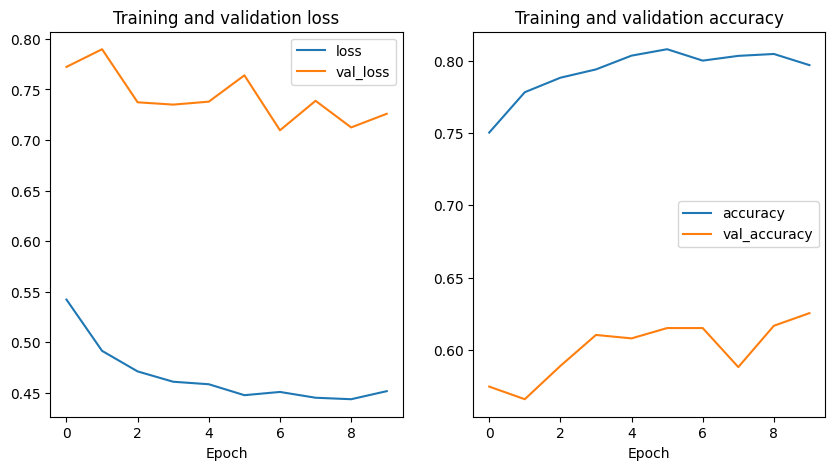

In [ ]:
leu_cb_name = "leu_inception_V3_maxn.keras"
train_model(leu_train_ds, leu_valid_ds, model_new, leu_cb_name, 'Adam', 'sparse_categorical_crossentropy')

1/1 [==============================] - 1s 1s/step


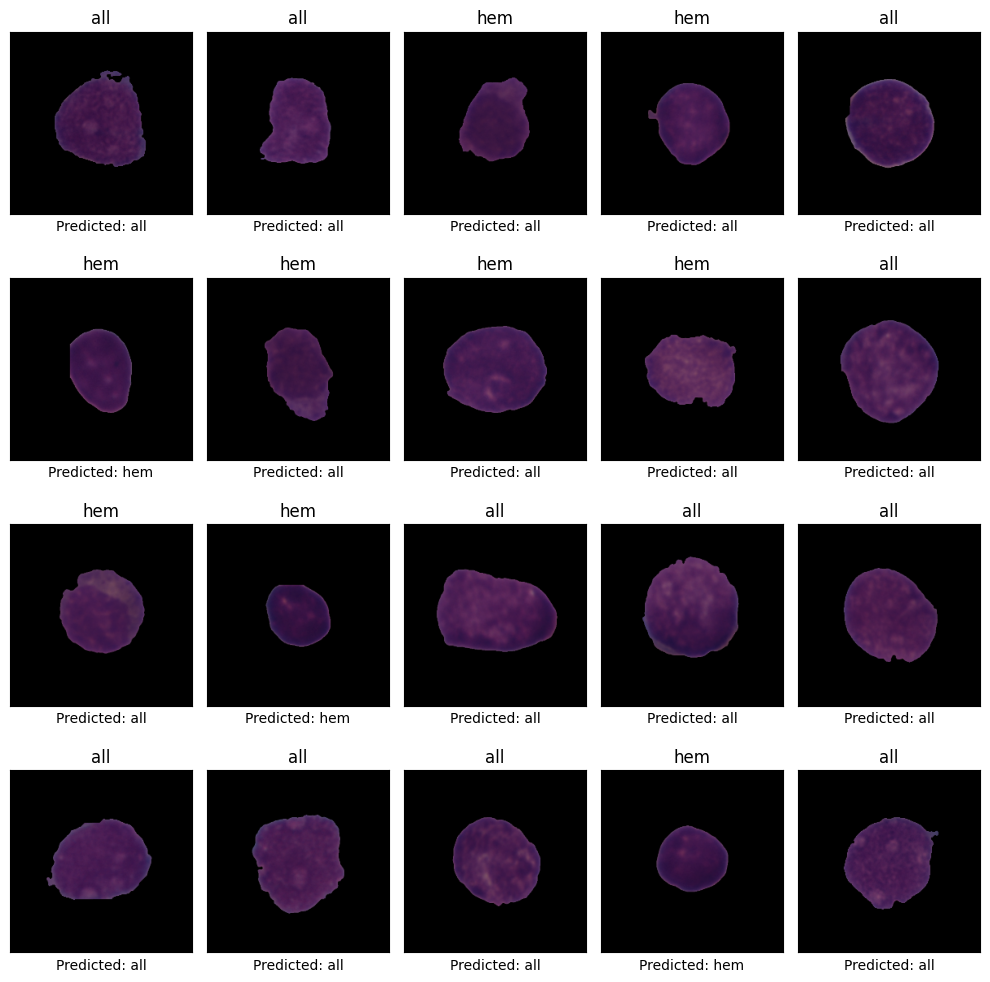

In [ ]:
evaluate_model(leu_cb_name, leu_test_ds)

Epoch 1/10
144/144 [==============================] - 75s 458ms/step - loss: 1.8243 - accuracy: 0.2435 - val_loss: 1.3974 - val_accuracy: 0.3552
Epoch 2/10
144/144 [==============================] - 57s 387ms/step - loss: 1.3836 - accuracy: 0.3550 - val_loss: 1.3699 - val_accuracy: 0.3552
Epoch 3/10
144/144 [==============================] - 55s 373ms/step - loss: 1.3602 - accuracy: 0.3552 - val_loss: 1.3512 - val_accuracy: 0.3552
Epoch 4/10
144/144 [==============================] - 60s 407ms/step - loss: 1.3445 - accuracy: 0.3552 - val_loss: 1.3382 - val_accuracy: 0.3552
Epoch 5/10
144/144 [==============================] - 55s 371ms/step - loss: 1.3343 - accuracy: 0.3552 - val_loss: 1.3298 - val_accuracy: 0.3552
Epoch 6/10
144/144 [==============================] - 55s 367ms/step - loss: 1.3271 - accuracy: 0.3552 - val_loss: 1.3244 - val_accuracy: 0.3552
Epoch 7/10
144/144 [==============================] - 55s 372ms/step - loss: 1.3227 - accuracy: 0.3552 - val_loss: 1.3210 - val_ac

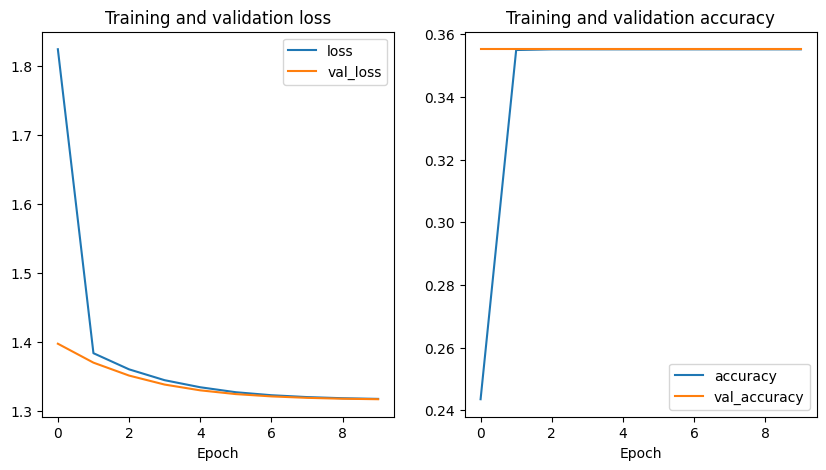

In [ ]:
Cxray_cb_name = "cxray_inception_V3_maxn.keras"
train_model(xray_train_ds, xray_valid_ds, model_new, Cxray_cb_name, 'Adam', 'sparse_categorical_crossentropy')

1/1 [==============================] - 1s 1s/step


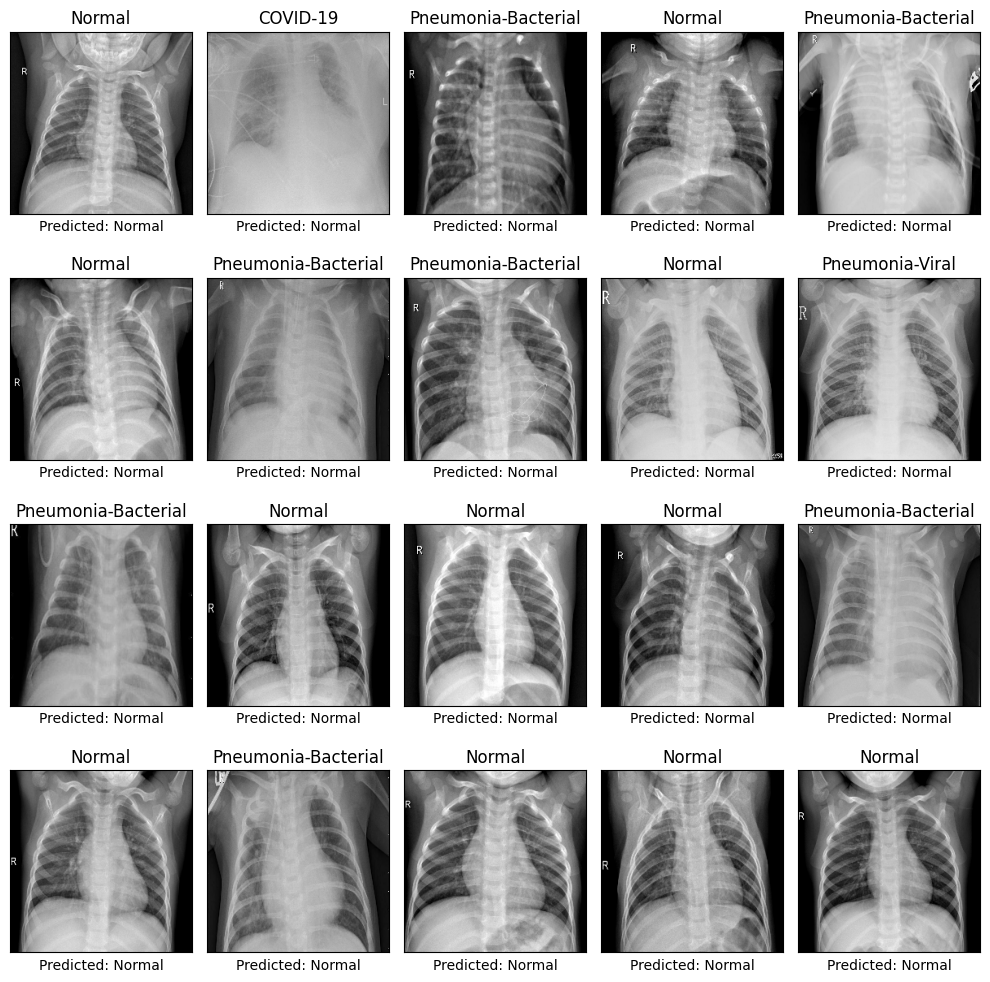

In [ ]:
evaluate_model(Cxray_cb_name, xray_test_ds)

## Experiment 5- model with best accuracy and predicted well
 

In [14]:
inputs = keras.Input(shape=(IMG_SIZE,IMG_SIZE,3))
x = data_augmentation(inputs)
x = layers.Resizing(IMG_SIZE,IMG_SIZE)(x)
x = tf.keras.applications.inception_v3.preprocess_input(x)

x = inceptionV3_base(x)
x = layers.BatchNormalization()(x)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Flatten()(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.5)(x)
outputs = layers.Dense(4, activation='softmax')(x)

model_bg = keras.Model(inputs, outputs)

model_bg.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 180, 180, 3)       0         
                                                                 
 resizing_1 (Resizing)       (None, 224, 224, 3)       0         
                                                                 
 tf.math.truediv_1 (TFOpLamb  (None, 224, 224, 3)      0         
 da)                                                             
                                                                 
 tf.math.subtract_1 (TFOpLam  (None, 224, 224, 3)      0         
 bda)                                                            
                                                                 
 inception_v3 (Functional)   (None, 5, 5, 2048)        218027

In [ ]:
NUM_EPOCHS = 15

In [ ]:
bt_cb_name = "bt_inception_gp.keras"
train_model(bt_train_ds, bt_valid_ds, model_bg, bt_cb_name, 'adam', 'sparse_categorical_crossentropy')

Epoch 1/15
143/143 [==============================] - 508s 4s/step - loss: 0.5526 - accuracy: 0.7998 - val_loss: 0.4784 - val_accuracy: 0.8135
Epoch 2/15
143/143 [==============================] - 494s 3s/step - loss: 0.3915 - accuracy: 0.8615 - val_loss: 0.4094 - val_accuracy: 0.8406
Epoch 3/15
143/143 [==============================] - 494s 3s/step - loss: 0.3223 - accuracy: 0.8803 - val_loss: 0.3387 - val_accuracy: 0.8695
Epoch 4/15
143/143 [==============================] - 491s 3s/step - loss: 0.2807 - accuracy: 0.8974 - val_loss: 0.3251 - val_accuracy: 0.8844
Epoch 5/15
143/143 [==============================] - 490s 3s/step - loss: 0.2791 - accuracy: 0.9013 - val_loss: 0.2995 - val_accuracy: 0.8993
Epoch 6/15
143/143 [==============================] - 488s 3s/step - loss: 0.2595 - accuracy: 0.9007 - val_loss: 0.2783 - val_accuracy: 0.8949
Epoch 7/15
143/143 [==============================] - 429s 3s/step - loss: 0.2379 - accuracy: 0.9074 - val_loss: 0.2964 - val_accuracy: 0.8923

1/1 [==============================] - 1s 1s/step


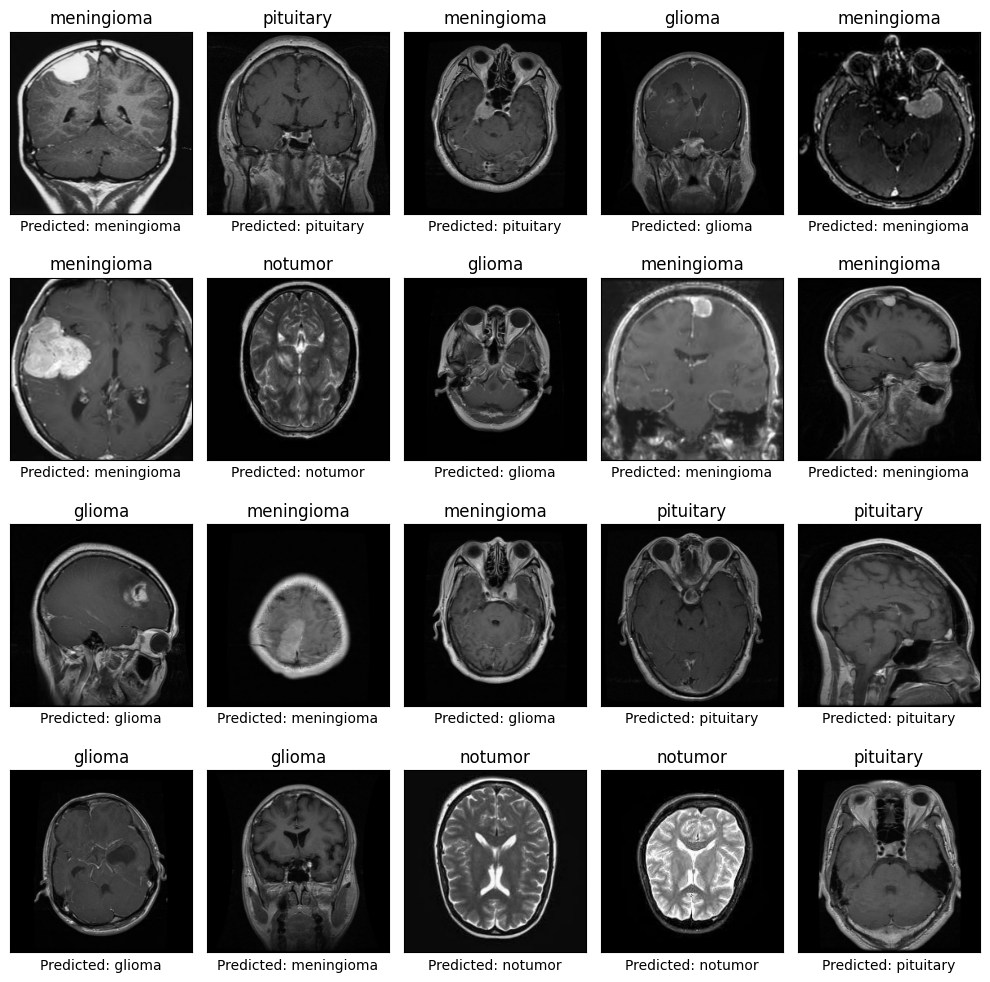

In [ ]:
evaluate_model(bt_cb_name, bt_test_ds)

Epoch 1/15
191/191 [==============================] - 35s 148ms/step - loss: 0.5622 - accuracy: 0.7511 - val_loss: 0.7970 - val_accuracy: 0.5802
Epoch 2/15
191/191 [==============================] - 25s 128ms/step - loss: 0.4714 - accuracy: 0.7929 - val_loss: 0.7601 - val_accuracy: 0.6198
Epoch 3/15
191/191 [==============================] - 22s 112ms/step - loss: 0.4517 - accuracy: 0.7980 - val_loss: 0.7976 - val_accuracy: 0.5984
Epoch 4/15
191/191 [==============================] - 21s 106ms/step - loss: 0.4398 - accuracy: 0.8020 - val_loss: 0.7878 - val_accuracy: 0.6198
Epoch 5/15
191/191 [==============================] - 22s 112ms/step - loss: 0.4354 - accuracy: 0.8130 - val_loss: 0.7492 - val_accuracy: 0.6222
Epoch 6/15
191/191 [==============================] - 20s 106ms/step - loss: 0.4281 - accuracy: 0.8118 - val_loss: 0.7593 - val_accuracy: 0.6302
Epoch 7/15
191/191 [==============================] - 20s 102ms/step - loss: 0.4183 - accuracy: 0.8156 - val_loss: 0.7512 - val_ac

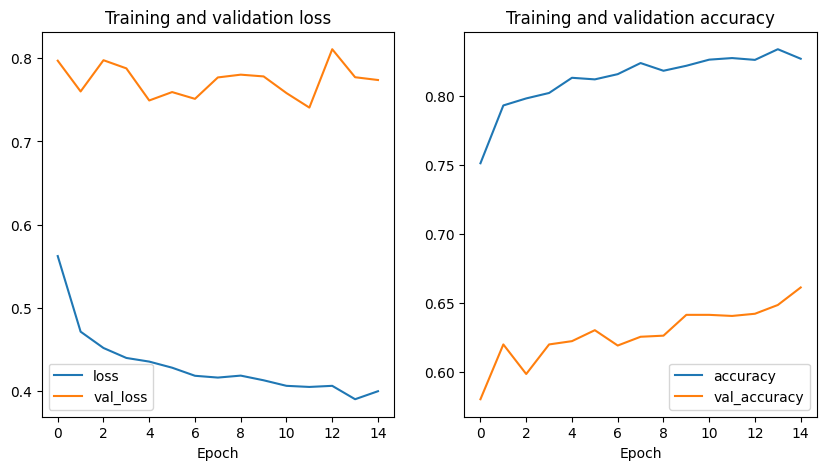

In [ ]:
leu_cb_name = "leu_inception_V3_bg.keras"
train_model(leu_train_ds, leu_valid_ds, model_bg, leu_cb_name, 'Adam', 'sparse_categorical_crossentropy')

1/1 [==============================] - 2s 2s/step


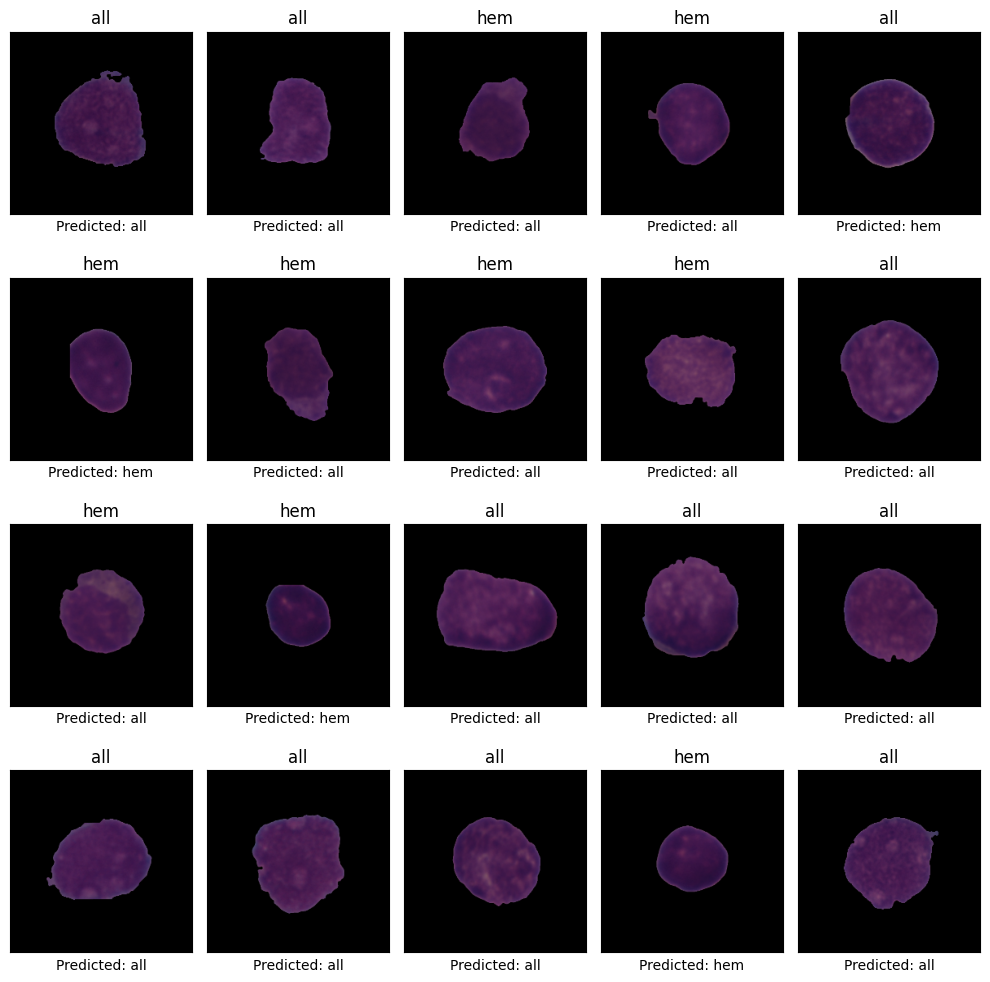

In [ ]:
evaluate_model(leu_cb_name, leu_test_ds)

Epoch 1/15
144/144 [==============================] - 73s 446ms/step - loss: 1.2395 - accuracy: 0.5809 - val_loss: 0.6866 - val_accuracy: 0.7230
Epoch 2/15
144/144 [==============================] - 66s 442ms/step - loss: 0.7032 - accuracy: 0.7071 - val_loss: 0.5682 - val_accuracy: 0.7632
Epoch 3/15
144/144 [==============================] - 57s 384ms/step - loss: 0.6368 - accuracy: 0.7319 - val_loss: 0.5267 - val_accuracy: 0.7816
Epoch 4/15
144/144 [==============================] - 57s 383ms/step - loss: 0.5972 - accuracy: 0.7510 - val_loss: 0.5397 - val_accuracy: 0.7936
Epoch 5/15
144/144 [==============================] - 55s 368ms/step - loss: 0.5790 - accuracy: 0.7589 - val_loss: 0.5112 - val_accuracy: 0.7985
Epoch 6/15
144/144 [==============================] - 56s 377ms/step - loss: 0.5901 - accuracy: 0.7573 - val_loss: 0.5226 - val_accuracy: 0.8034
Epoch 7/15
144/144 [==============================] - 56s 370ms/step - loss: 0.5647 - accuracy: 0.7652 - val_loss: 0.5556 - val_ac

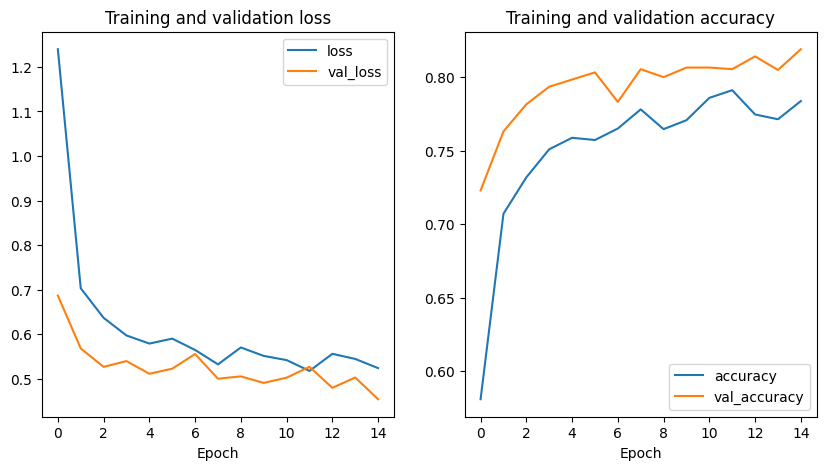

In [ ]:
Cxray_cb_name = "cxray_inception_V3_bg.keras"
train_model(xray_train_ds, xray_valid_ds, model_bg, Cxray_cb_name, 'Adam', 'sparse_categorical_crossentropy')

1/1 [==============================] - 1s 1s/step


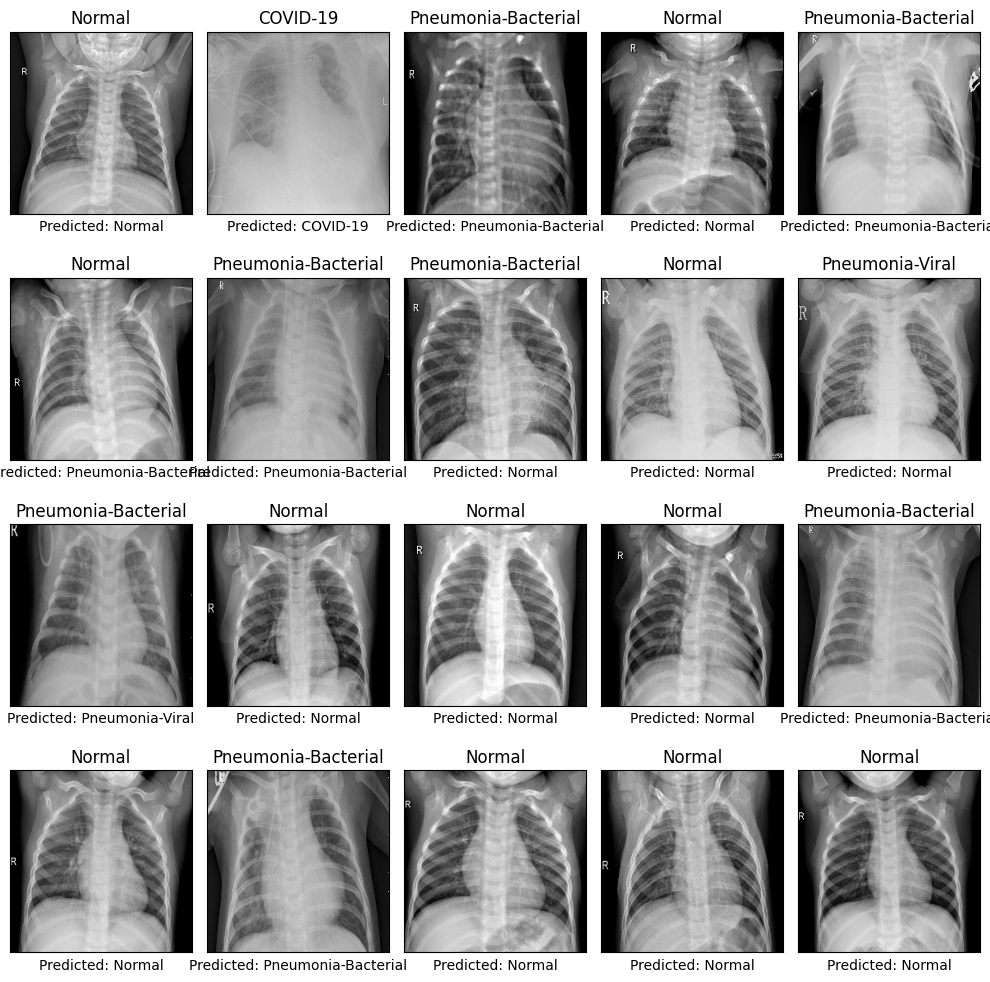

In [ ]:
evaluate_model(Cxray_cb_name, xray_test_ds)